## **1. 생활인구 데이터 소개**

- 생활인구 데이터
> 서울시와 KT가 공공빅데이터와 통신데이터를 이용하여 추계한 서울의 특정지역, 특정시점에 존재하는 모든 인구

- 데이터 유의사항
> 1. 서울 생활인구는 통계적 방법에 의해 추정된 인구로 특정 지역이나 시점에 따라 실제와 다를 수 있습니다. <br> ※ 이용자 의견수렴 등의 절차를 거쳐 지속적으로 개선 예정
> 2. 제공 데이터는 개인정보 비 식별화를 위하여 ‘3명’ 이하인 경우 “ * ” 처리
> 3. 추정된 데이터로 소수점(5자리)이하 값이 있으며, 각 값의 합은 전체합계와 일치하지 않을 수 있습니다.
> 4. 2019.10.15~10.27 일부 통신수집기 장비고장으로 해당기간 제외

- 대상 범위
> 1. 내국인 : '서울에서 생활한 서울 내 지역인구'와 '서울에서 생활한 서울 외 지역 인구'로 구분한다.
> 2. 장기체류 외국인 : 90일 이상의 체류를 목적으로 입국한 외국인으로 외국인 등록증을 보유한다.
> 3. 단기체류 외국인 : 90일 미만의 체류를 목적으로 입국한 외국인으로, 해외 로밍 데이터를 활용한다.

- 시간 범위
> 2017년 1월 1일부터 현재까지 공개되고 있으며, 데이터는 매 시간 단위로 집계하며, 5일이 경과한 후에 공개한다.

- 공간 범위
> 데이터가 커버하는 공간적 범위는 서울시이다. 공간 집계 단위는 집계구, 행정동, 자치구이며 각각 별도의 파일로 제공한다. 집계구는 해당 행정동에 포함되고, 행정동은 해당 자치구에 포함된다.

- 집계구 단위
> 1. 서울을 19,153개의 집계구 공간으로 나누어서 집계하므로, 가장 세밀하게 생활인구를 파악할 수 있는 단위이다. 하지만 집계구 코드는 숫자로만 이루어져 있어 그 코드만으로 해당 위치를 이해하기 어려운 한계가 있다.
> 2. 행정동 코드 : 생활인구 측정 지역으로, 행정동을 나타내는 코드이다. 8자리로 구성되며, 행정안전부의 코드를 이용한다. 코드와 매칭되는 행정동 명칭은 자치구 단위 > 행정구역 코드정보에서 다운받을 수 있다.
> 3. 집계구 코드 : 생활인구 집계단위인 집계구를 나타내는 코드이다. 13자리로 구성되며, 2016년 기준 통계청 집계구 코드를 이용한다.
> 4. 생활인구 : 측정 일시, 측정 집계구 단위에서의 총 생활인구 수이다.
> 5. 연령 / 성별 인구 : 측정 일시, 측정 집계구에서의 연령/성별 생활인구 수이다. 익명성처리지침에 따라 데이터의 값이 3이하인 경우 * 처리한다.

- 통계지역경계 (집계구.shp, 2016)
> 통계청에서 제공하는 집계구와 행정동 경계 Shape 파일이다. 통계지역 경계 데이터의 좌표계는 UTM-K (GRS80), EPSG:5197이다.

- 행정동 단위
> 서울을 424개의 행정동 공간으로 나누어서 집계한다. 집계구에 비하여 공간이 크므로 상세한 분석은 어렵지만, 익숙한 명칭을 사용하기 때문에 분석 과정이 간단하고 결과를 공유하기 쉽다.

- 서울에서 생활한 서울 외 지역 인구
> 1. 서울 외 지역에서 거주하며, 통근/통학, 쇼핑, 관광 등 특정 시점에서 서울의 특정 지역에 존재하는 내국인과 장기 체류 외국인 수를 집계한 데이터이다.
> 2. 행정동 코드: 생활인구 측정 지역으로, 행정동을 나타내는 코드이다.
> 3. 거주지 코드: 경기도와 인천 지역은 시/군(52)의 코드이고, 그 외 지역은 광역시도(14개) 코드이다.
> 순위: 해당 행정동에서 많이 생활한 서울 외 지역(거주지)의 순서이다.

- 서울에서 생활한 서울 내 지역 인구
> 1. 서울 내 지역에서 거주하며, 통근/통학, 쇼핑, 관광 등 특정시점에서 서울의 특정 지역에 존재하는 내국인과 장기 체류 외국인 수를 집계한 테이블 형태의 데이터이다.
> 2. 거주지 자치구 코드 : 서울의 각 자치구(25개)의 코드이다.


## **2. 생활인구 집계구 단위 데이터 (2022년 1월)**

In [ ]:
# 코랩 한글 설치
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf

In [ ]:
# 전처리 라이브러리
import pandas as pd
import numpy as np
import os

# 시각화 라이브러리
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

# 내부에 결과를 출력하도록 설정
%matplotlib inline
plt.rc('font', family='NanumBarunGothic') 

# 마이너스 기호 출력
plt.rc('axes', unicode_minus=False)

# 분석에 문제가 없는 경고 메시지 숨김
import warnings
warnings.filterwarnings('ignore')

1번, 2번 무시 on

### **1. 데이터 불러오기**

In [ ]:
# 데이터 불러오기
os.chdir('/content/drive/Shareddrives/강서구/220311 EDA/집계구 단위/')
df_lp = pd.read_csv('LOCAL_PEOPLE_20220305.csv', encoding="CP949")

# 강서구의 행정코드는 11500510~11500641
gs_lp = df_lp[(df_lp['행정동코드'] >= 11500510) & (df_lp['행정동코드'] <= 11500641)]
gs_lp = gs_lp.reset_index(drop=True)

# 한글 columns명이 너무 길어서 영어명(생활인구_스키마_공개 파일 기준)으로 간소화
gs_lp_kor = gs_lp.columns
gs_lp.columns = ['YMD','TT','H_DNG_CD','SMGU_CD','SPOP',
                 'M00','M10','M15','M20','M25','M30','M35','M40','M45','M50','M55','M60','M65','M70',
                 'F00','F10','F15','F20','F25','F30','F35','F40','F45','F50','F55','F60','F65','F70']

# 분포 등을 확인하기 위해 인구수가 3명 이하(*)인 경우 0으로 대체 (단, 이후 문제가 생길 수 있으므로 주의해야 함)
for i in range(5, 33):
    gs_lp.iloc[:,i] = gs_lp.iloc[:,i].apply(lambda x : 0 if x=='*' else x)
    gs_lp.iloc[:,i] = gs_lp.iloc[:,i].astype('float64')

gs_lp.head()

,YMD,TT,H_DNG_CD,SMGU_CD,SPOP,M00,M10,M15,M20,M25,...,F25,F30,F35,F40,F45,F50,F55,F60,F65,F70
0,20220305,19,11500540,1116073020004,73.3440,0.0,0.0,0.0,0.0,4.8926,...,0.0,0.0,5.1532,5.4365,4.929,0.0,4.9822,4.0674,0.0,8.6031
1,20220305,23,11500540,1116073020004,10.1920,0.0,0.0,0.0,0.0,0.0000,...,0.0,0.0,0.0000,0.0000,0.000,0.0,0.0000,0.0000,0.0,0.0000
2,20220305,15,11500540,1116073032401,53.0328,0.0,0.0,0.0,0.0,0.0000,...,0.0,0.0,0.0000,0.0000,0.000,0.0,0.0000,0.0000,0.0,0.0000
3,20220305,14,11500560,1116058010005,20.4153,0.0,0.0,0.0,0.0,0.0000,...,0.0,0.0,0.0000,0.0000,0.000,0.0,0.0000,0.0000,0.0,0.0000
4,20220305,19,11500560,1116058010005,36.4446,0.0,0.0,0.0,0.0,0.0000,...,0.0,0.0,0.0000,0.0000,0.000,0.0,0.0000,0.0000,0.0,0.0000


### **2. 시간 및 행정동명을 기준으로 시각화**

In [ ]:
# 시간 및 행정동명을 기준으로 데이터 만들기
gs_lp_th = gs_lp.groupby(['TT', 'H_DNG_CD']).sum()
gs_lp_th.drop(['YMD', 'SMGU_CD'], axis=1, inplace=True) # SPOP 값이 전체합계와 일치하지 않을 수 있음에 주의
gs_lp_th.reset_index(inplace=True)
gs_lp_th.head()

,TT,H_DNG_CD,SPOP,M00,M10,M15,M20,M25,M30,M35,...,F25,F30,F35,F40,F45,F50,F55,F60,F65,F70
0,0,11500510,34259.0237,1627.9661,829.2430,807.0558,621.5937,1095.5779,1516.5058,1854.2216,...,1478.6458,1869.4998,1982.3046,1796.1506,1441.5757,1022.3699,1075.8039,983.0399,664.0571,1560.5475
1,0,11500520,24048.9845,753.0151,341.8818,422.2140,600.3737,1101.5304,1401.2670,1430.4134,...,1860.0108,1791.2498,1392.1487,807.4667,866.6214,671.9790,751.2304,668.4647,457.6349,1260.8845
2,0,11500530,19086.2817,648.7365,329.9201,559.9076,459.5396,653.8220,872.7977,873.0427,...,849.1591,872.3180,927.7168,729.8947,774.0950,718.0583,877.7194,756.2197,536.9010,1297.5538
3,0,11500535,35988.8108,845.9132,478.2148,846.0443,923.3924,1250.5131,1536.3923,1485.9662,...,1645.9540,1648.9935,1521.5499,1309.1395,1328.1355,1108.9730,1327.6940,1238.2945,1063.0211,3135.7442
4,0,11500540,53067.1894,1605.8563,515.1933,776.7953,1358.3539,2799.8058,2965.4402,2818.2765,...,3111.8285,3010.4635,2497.4938,1909.1649,1925.2474,1692.6238,1952.6359,1857.5234,1579.4534,3539.3042


In [ ]:
gs_lg = ['염창동','등촌1동', '등촌2동', '등촌3동', '화곡1동', '화곡2동', '화곡3동', '화곡4동', '화곡본동', '화곡6동', '화곡8동',
         '가양1동', '가양2동', '가양3동', '발산1동', '우장산동', '공항동','방화1동','방화2동','방화3동']
gs_cd = gs_lp_th['H_DNG_CD'].unique()
gs_dict =  {gs_cd[i] : gs_lg[i] for i in range(len(gs_lg))}

In [ ]:
# 2022년 3월 5일의 행정동별 생활인구 그래프 생성
# 남성
plt.figure(figsize=(60,30), facecolor="white")
for i in range(0, 14):
    ax = plt.subplot(3,5,i+1)
    sns.lineplot(data=gs_lp_th, x='TT', y=gs_lp_th.columns[i+3], hue="H_DNG_CD", palette="husl")
    for j in range(len(gs_lg)):
        plt.text(23.1, gs_lp_th[(gs_lp_th['H_DNG_CD']==gs_cd[j]) & (gs_lp_th['TT']==23)][gs_lp_th.columns[i+3]], gs_lg[j], fontsize=11)
    plt.title('행정동별 '+gs_lp_kor[5+i]+' 그래프', fontsize=20)
    plt.xlabel('시간(시)')
    plt.ylabel('생활인구수(명)')
    ax.get_legend().remove()
plt.legend(labels=gs_lg, loc = 2, bbox_to_anchor = (1,1), fontsize=12)
plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# 2022년 3월 5일의 행정동별 생활인구 그래프 생성
# 여성
plt.figure(figsize=(60,30), facecolor="white")
for i in range(0, 14):
    ax = plt.subplot(3,5,i+1)
    sns.lineplot(data=gs_lp_th, x='TT', y=gs_lp_th.columns[i+17], hue="H_DNG_CD", palette="husl")
    plt.legend(labels=gs_lg, loc = 2, bbox_to_anchor = (1,1), fontsize=12)
    for j in range(len(gs_lg)):
        plt.text(23.1, gs_lp_th[(gs_lp_th['H_DNG_CD']==gs_cd[j]) & (gs_lp_th['TT']==23)][gs_lp_th.columns[i+17]], gs_lg[j], fontsize=11)
    plt.title('행정동별 '+gs_lp_kor[19+i]+' 그래프', fontsize=20)
    plt.xlabel('시간(시)')
    plt.ylabel('생활인구수(명)')
    ax.get_legend().remove()
plt.legend(labels=gs_lg, loc = 2, bbox_to_anchor = (1,1), fontsize=12)
plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
gs_lp_th['H_DNG_CD'] = gs_lp_th['H_DNG_CD'].apply(lambda x : gs_dict.get(x) if x else x)

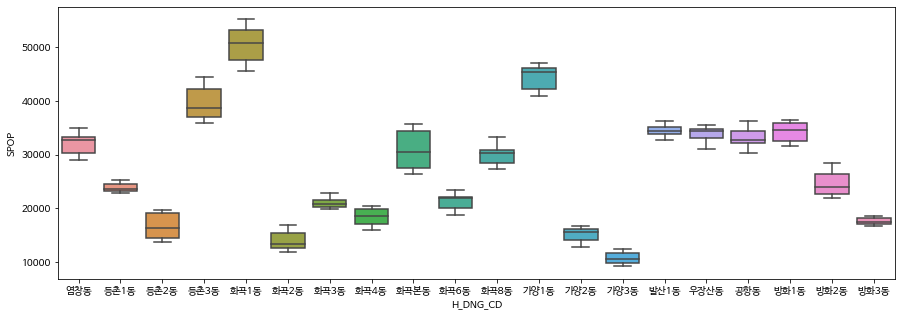

In [ ]:
# 행정동별 하루동안의 생활인구 합계수
plt.figure(figsize=(15,5), facecolor="white")
sns.boxplot(data=gs_lp_th, x='H_DNG_CD', y='SPOP')

- 그래프를 통해 도출해낼 수 있는 인사이트
> 1. 생활인구의 많고 적음
> 2. 하루동안의 생활인구의 변화율

In [ ]:
# 시간 및 집계구코드를 기준으로 데이터 만들기
gs_lp_ts = gs_lp.groupby(['TT', 'SMGU_CD']).sum()
gs_lp_ts.drop(['YMD', 'H_DNG_CD'], axis=1, inplace=True) # SPOP 값이 전체합계와 일치하지 않을 수 있음에 주의
gs_lp_ts.reset_index(inplace=True)
gs_lp_ts.head()

,TT,SMGU_CD,SPOP,M00,M10,M15,M20,M25,M30,M35,...,F25,F30,F35,F40,F45,F50,F55,F60,F65,F70
0,0,1116051010002,983.6818,53.1609,27.5127,19.1041,18.0452,38.5998,41.9849,61.2561,...,38.9622,46.1911,53.2430,48.7477,44.5577,28.1297,33.3477,43.6253,23.1204,57.4408
1,0,1116051010004,276.9946,14.9106,7.7168,8.3657,6.9258,6.4520,9.4873,8.1834,...,8.0833,12.1859,12.2219,14.7814,7.7847,6.2810,7.9940,4.9978,6.4646,14.0303
2,0,1116051010005,95.3841,4.8642,0.0000,0.0000,0.0000,0.0000,0.0000,5.3550,...,0.0000,0.0000,5.9039,6.5166,4.0375,0.0000,0.0000,0.0000,0.0000,0.0000
3,0,1116051010006,1004.5720,42.5200,22.0056,29.9338,30.2036,32.4237,48.2802,62.4447,...,53.0326,53.0040,53.6768,43.7694,34.8671,24.3513,32.1865,28.9971,21.1892,43.8496
4,0,1116051010007,145.6141,11.5819,5.9940,4.5709,0.0000,0.0000,5.0008,5.2930,...,0.0000,5.3758,7.1785,10.1288,9.1384,0.0000,4.6485,4.0189,0.0000,8.9450


## **3. 행정구 단위 데이터 (2월)**

### **1. 2월 평균 그래프**

In [ ]:
# 데이터 불러오기
os.chdir('/content/drive/Shareddrives/강서구/220311 EDA/행정구 단위/')
df_lpd_2202 = pd.read_csv('LOCAL_PEOPLE_DONG_202202.csv')

# 한글 columns명이 너무 길어서 영어명(생활인구_스키마_공개 파일 기준)으로 간소화
df_lpd_kor = df_lpd_2202.columns
df_lpd_2202.reset_index(inplace=True)
df_lpd_2202 = df_lpd_2202.drop(['여자70세이상생활인구수'], axis=1) # 한칸씩 밀리는 오류 해결
df_lpd_2202.columns = ['YMD','TT','H_DNG_CD','SPOP',
                       'M00','M10','M15','M20','M25','M30','M35','M40','M45','M50','M55','M60','M65','M70',
                       'F00','F10','F15','F20','F25','F30','F35','F40','F45','F50','F55','F60','F65','F70']

# 강서구의 행정코드는 11500510~11500641
gs_lpd_2202 = df_lpd_2202[(df_lpd_2202['H_DNG_CD'] >= 11500510) & (df_lpd_2202['H_DNG_CD'] <= 11500641)]
gs_lpd_2202 = gs_lpd_2202.reset_index(drop=True)

# 행정동
gs_lg = ['염창동','등촌1동', '등촌2동', '등촌3동', '화곡1동', '화곡2동', '화곡3동', '화곡4동', '화곡본동', '화곡6동', '화곡8동',
         '가양1동', '가양2동', '가양3동', '발산1동', '우장산동', '공항동','방화1동','방화2동','방화3동']
gs_cd = [11500510,11500520,11500530,11500535,11500540,11500550,11500560,11500570,11500590,11500591,
         11500593,11500603,11500604,11500605,11500611,11500615,11500620,11500630,11500640,11500641]
gs_dict =  {gs_cd[i] : gs_lg[i] for i in range(len(gs_lg))}
gs_lpd_2202['H_DNG_CD'] = gs_lpd_2202['H_DNG_CD'].apply(lambda x : gs_dict.get(x) if x else x)

# 행정동별 2월 평균 생활인구 구하기
gs_lpd_2202_th = gs_lpd_2202.groupby(['TT', 'H_DNG_CD']).mean() 
gs_lpd_2202_th.drop(['YMD'], axis=1, inplace=True) # SPOP 값이 전체합계와 일치하지 않을 수 있음에 주의
gs_lpd_2202_th.reset_index(inplace=True)

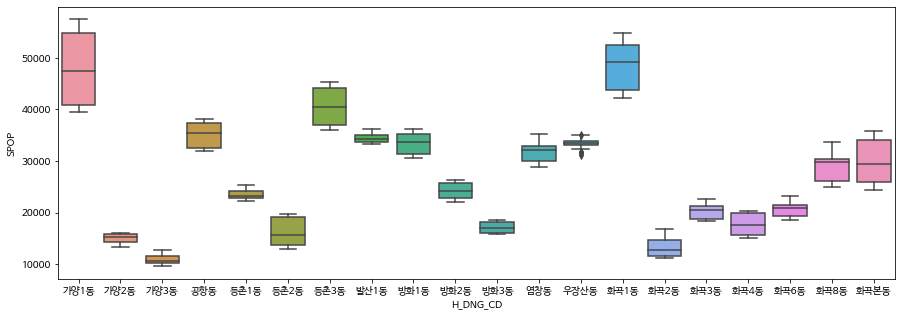

In [ ]:
plt.figure(figsize=(15,5), facecolor="white")
sns.boxplot(data=gs_lpd_2202_th, x='H_DNG_CD', y='SPOP')

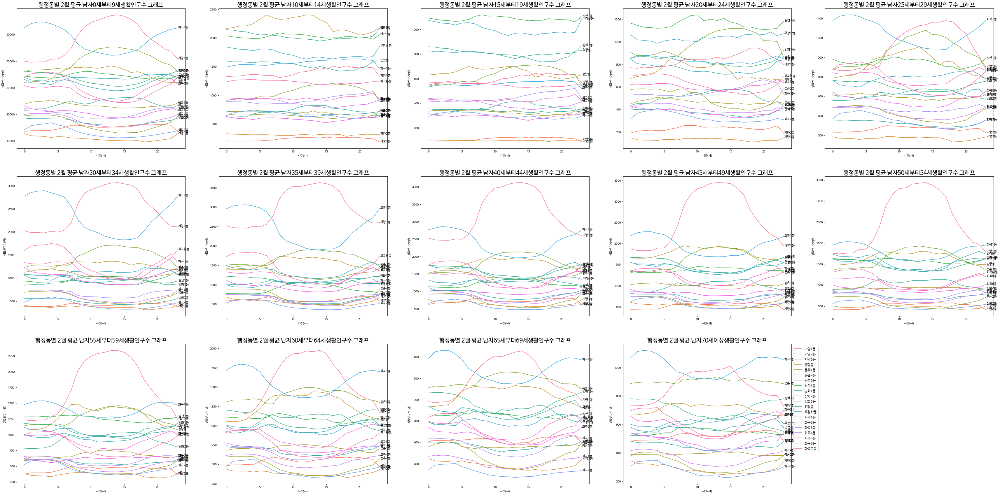

In [ ]:
# 2022년 2월 행정동별 평균 생활인구 그래프 생성
# 남성
plt.figure(figsize=(60, 30), facecolor="white")
for i in range(0, 14):
    ax = plt.subplot(3,5,i+1)
    sns.lineplot(data=gs_lpd_2202_th, x='TT', y=gs_lpd_2202_th.columns[i+2], hue="H_DNG_CD", palette="husl")
    for j in range(len(gs_lg)):
        plt.text(23.1, gs_lpd_2202_th[(gs_lpd_2202_th['H_DNG_CD']==gs_lg[j]) & (gs_lpd_2202_th['TT']==23)][gs_lpd_2202_th.columns[i+2]], gs_lg[j], fontsize=11)
    plt.title('행정동별 2월 평균 '+df_lpd_kor[4+i]+' 그래프', fontsize=20)
    plt.xlabel('시간(시)')
    plt.ylabel('생활인구수(명)')
    ax.get_legend().remove()
plt.legend(loc = 2, bbox_to_anchor = (1,1), fontsize=12)
plt.show()

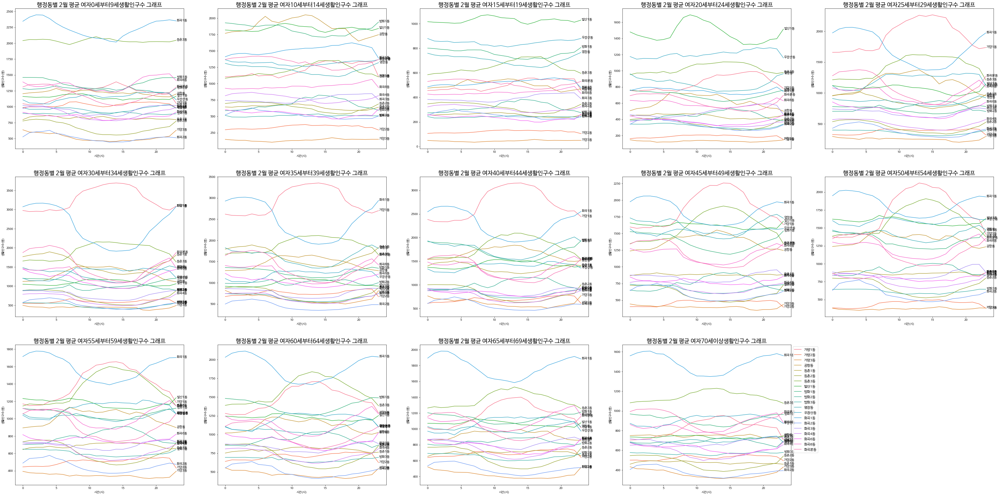

In [ ]:
# 2022년 2월 행정동별 평균 생활인구 그래프 생성
# 여성
plt.figure(figsize=(60,30), facecolor="white")
for i in range(0, 14):
    ax = plt.subplot(3,5,i+1)
    sns.lineplot(data=gs_lpd_2202_th, x='TT', y=gs_lpd_2202_th.columns[i+16], hue="H_DNG_CD", palette="husl")
    for j in range(len(gs_lg)):
        plt.text(23.1, gs_lpd_2202_th[(gs_lpd_2202_th['H_DNG_CD']==gs_lg[j]) & (gs_lpd_2202_th['TT']==23)][gs_lpd_2202_th.columns[i+16]], gs_lg[j], fontsize=11)
    plt.title('행정동별 2월 평균 '+df_lpd_kor[18+i]+' 그래프', fontsize=20)
    plt.xlabel('시간(시)')
    plt.ylabel('생활인구수(명)')
    ax.get_legend().remove()
plt.legend(loc = 2, bbox_to_anchor = (1,1), fontsize=12)
plt.show()

- 그래프를 통해 도출해낼 수 있는 인사이트
> 1. 화곡1동, 화곡본동, 등촌2동, 화곡8동: 거주지가 많음
> 2. 가양1동, 등촌3동, 방화2동, 공항동: 근무지가 많음
> 4. 발산1동, 우장산동: 학교, 학원 등이 많음

- 눈여겨볼점
> 1. 저녁시간에 피크찍었다가 다시 밤에 내려오는 경우 존재 -> 번화가?

### **2. 2월 평일 평균 그래프**

In [ ]:
# 행정동별 2월 평일(토요일, 일요일 제외) 평균 생활인구 구하기
# 공휴일은 따로 처리 안해줌 (api 가져오기 귀찮아서...)
gs_lpd_2202["DATETIME"] = pd.to_datetime(gs_lpd_2202["YMD"], format='%Y%m%d')
gs_lpd_2202["WEEKDAY"] = gs_lpd_2202["DATETIME"].dt.weekday
gs_lpd_2202_wd = gs_lpd_2202[(gs_lpd_2202['WEEKDAY']!=5) & (gs_lpd_2202['WEEKDAY']!=6)]
gs_lpd_2202_wd_th = gs_lpd_2202_wd.groupby(['TT', 'H_DNG_CD']).mean() 
gs_lpd_2202_wd_th.drop(['YMD','WEEKDAY'], axis=1, inplace=True) # SPOP 값이 전체합계와 일치하지 않을 수 있음에 주의
gs_lpd_2202_wd_th.reset_index(inplace=True)

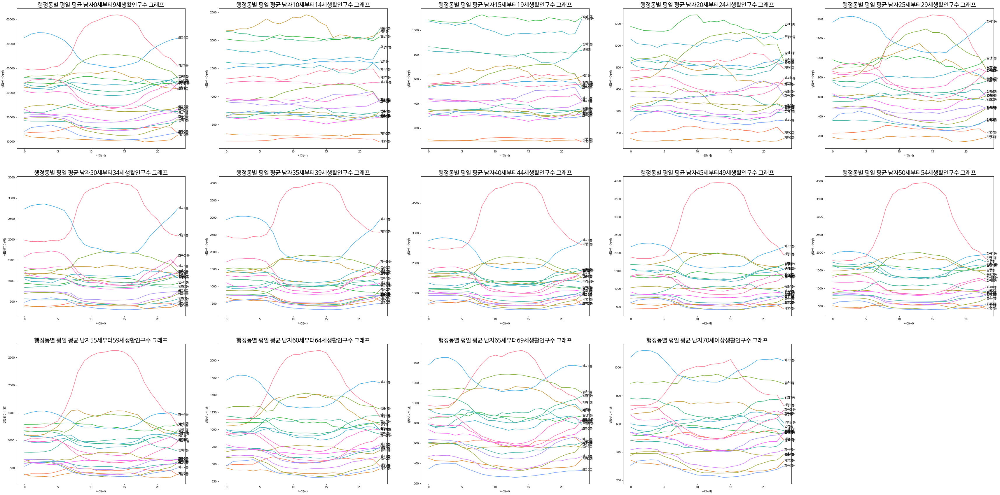

In [ ]:
# 2022년 2월 행정동별 평균 생활인구 그래프 생성
# 남성
plt.figure(figsize=(60,30), facecolor="white")
for i in range(0, 14):
    ax = plt.subplot(3,5,i+1)
    sns.lineplot(data=gs_lpd_2202_wd_th, x='TT', y=gs_lpd_2202_wd_th.columns[i+2], hue="H_DNG_CD", palette="husl")
    for j in range(len(gs_lg)):
        plt.text(23.1, gs_lpd_2202_wd_th[(gs_lpd_2202_wd_th['H_DNG_CD']==gs_lg[j]) & (gs_lpd_2202_wd_th['TT']==23)][gs_lpd_2202_wd_th.columns[i+2]], gs_lg[j], fontsize=11)
    plt.title('행정동별 평일 평균 '+df_lpd_kor[4+i]+' 그래프', fontsize=20)
    plt.xlabel('시간(시)')
    plt.ylabel('생활인구수(명)')
    ax.get_legend().remove()
plt.show()

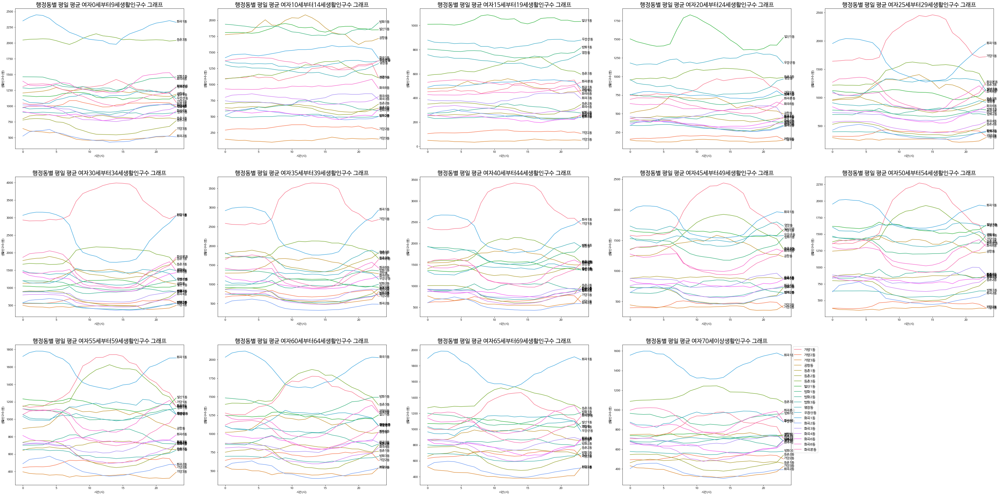

In [ ]:
# 2022년 2월 행정동별 평균 생활인구 그래프 생성
# 여성
plt.figure(figsize=(60,30), facecolor="white")
for i in range(0, 14):
    ax = plt.subplot(3,5,i+1)
    sns.lineplot(data=gs_lpd_2202_wd_th, x='TT', y=gs_lpd_2202_wd_th.columns[i+16], hue="H_DNG_CD", palette="husl")
    for j in range(len(gs_lg)):
        plt.text(23.1, gs_lpd_2202_wd_th[(gs_lpd_2202_wd_th['H_DNG_CD']==gs_lg[j]) & (gs_lpd_2202_wd_th['TT']==23)][gs_lpd_2202_wd_th.columns[i+16]], gs_lg[j], fontsize=11)
    plt.title('행정동별 평일 평균 '+df_lpd_kor[18+i]+' 그래프', fontsize=20)
    plt.xlabel('시간(시)')
    plt.ylabel('생활인구수(명)')
    ax.get_legend().remove()
plt.legend(loc = 2, bbox_to_anchor = (1,1), fontsize=12)
plt.show()

### **3. 2월 주말 평균 그래프**

In [ ]:
# 행정동별 2월 평일(토요일, 일요일 제외) 평균 생활인구 구하기
# 공휴일은 따로 처리 안해줌 (api 가져오기 귀찮아서...)
gs_lpd_2202_wd2 = gs_lpd_2202[(gs_lpd_2202['WEEKDAY']==5) | (gs_lpd_2202['WEEKDAY']==6)]
gs_lpd_2202_wd2_th = gs_lpd_2202_wd2.groupby(['TT', 'H_DNG_CD']).mean() 
gs_lpd_2202_wd2_th.drop(['YMD','WEEKDAY'], axis=1, inplace=True) # SPOP 값이 전체합계와 일치하지 않을 수 있음에 주의
gs_lpd_2202_wd2_th.reset_index(inplace=True)

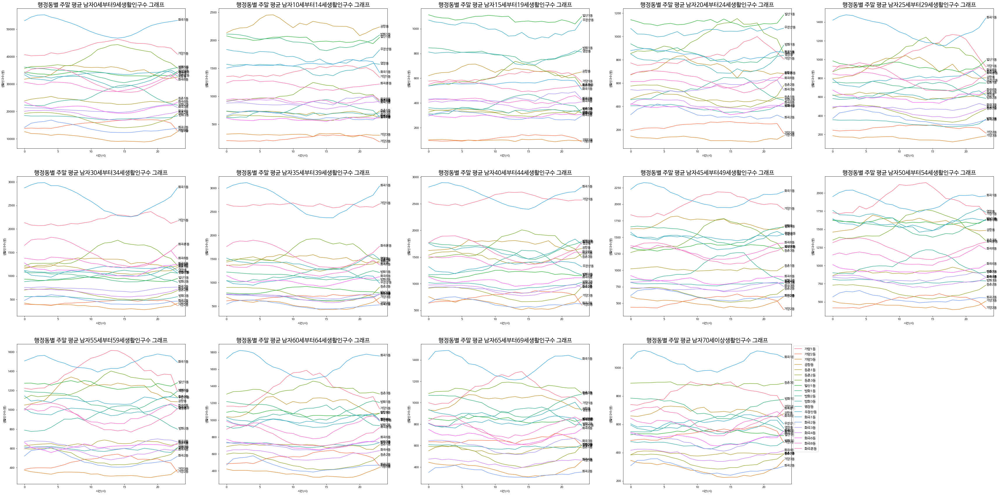

In [ ]:
# 2022년 2월 행정동별 평균 생활인구 그래프 생성
# 남성
plt.figure(figsize=(60,30), facecolor="white")
for i in range(0, 14):
    ax = plt.subplot(3,5,i+1)
    sns.lineplot(data=gs_lpd_2202_wd2_th, x='TT', y=gs_lpd_2202_wd2_th.columns[i+2], hue="H_DNG_CD", palette="husl")
    for j in range(len(gs_lg)):
        plt.text(23.1, gs_lpd_2202_wd2_th[(gs_lpd_2202_wd2_th['H_DNG_CD']==gs_lg[j]) & (gs_lpd_2202_wd2_th['TT']==23)][gs_lpd_2202_wd2_th.columns[i+2]], gs_lg[j], fontsize=11)
    plt.title('행정동별 주말 평균 '+df_lpd_kor[4+i]+' 그래프', fontsize=20)
    plt.xlabel('시간(시)')
    plt.ylabel('생활인구수(명)')
    ax.get_legend().remove()
plt.legend(loc = 2, bbox_to_anchor = (1,1), fontsize=12)
plt.show()

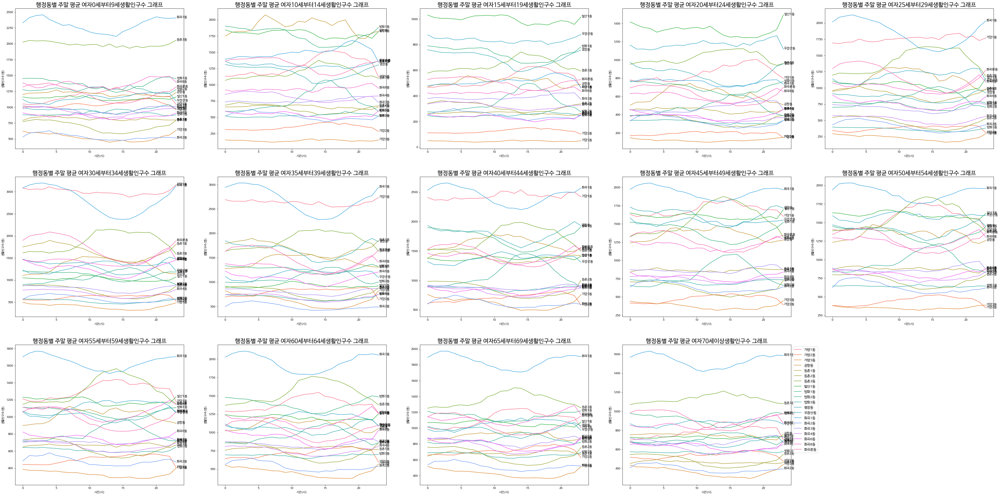

In [ ]:
# 2022년 2월 행정동별 평균 생활인구 그래프 생성
# 여성
plt.figure(figsize=(60,30), facecolor="white")
for i in range(0, 14):
    ax = plt.subplot(3,5,i+1)
    sns.lineplot(data=gs_lpd_2202_wd2_th, x='TT', y=gs_lpd_2202_wd2_th.columns[i+16], hue="H_DNG_CD", palette="husl")
    for j in range(len(gs_lg)):
        plt.text(23.1, gs_lpd_2202_wd2_th[(gs_lpd_2202_wd2_th['H_DNG_CD']==gs_lg[j]) & (gs_lpd_2202_wd2_th['TT']==23)][gs_lpd_2202_wd2_th.columns[i+16]], gs_lg[j], fontsize=11)
    plt.title('행정동별 주말 평균 '+df_lpd_kor[18+i]+' 그래프', fontsize=20)
    plt.xlabel('시간(시)')
    plt.ylabel('생활인구수(명)')
    ax.get_legend().remove()
plt.legend(loc = 2, bbox_to_anchor = (1,1), fontsize=12)
plt.show()

- 생각해볼 점
> 1. 생활인구 그래프가 비슷한 양상을 보이는 것은 하나로 그룹화할 수 있어보임
> 2. 남성과 여성의 생활인구수 그래프에서 약간 차이가 나타남.
> 3. 공항동 -> 유치원, 학교 등 고려해봐야 함